In [1]:
# Install open_clip and dependencies
import os
os.system("pip install open_clip_torch==2.23.0")

import torch
from PIL import Image
import json
from open_clip import create_model_from_pretrained, get_tokenizer
import logging

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Check GPU availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
logger.info(f"Using device: {device}")

# Load BiomedCLIP model and tokenizer
try:
    model, preprocess = create_model_from_pretrained(
        'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
    )
    tokenizer = get_tokenizer(
        'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
    )
    model.to(device)
    model.eval()
    logger.info("Model and tokenizer loaded successfully")
except Exception as e:
    logger.error(f"Error loading model: {e}")
    raise

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 87.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.8.93
    Uninstalling nvidia-nvjitlink-cu12-12.8.93:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.8.93
  Attempting uninstall: nvidia-curand-cu12
    Found existing install

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pylibcugraph-cu12 24.12.0 requires pylibraft-cu12==24.12.*, but you have pylibraft-cu12 25.2.0 which is incompatible.
pylibcugraph-cu12 24.12.0 requires rmm-cu12==24.12.*, but you have rmm-cu12 25.2.0 which is incompatible.


/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


open_clip_pytorch_model.bin:   0%|          | 0.00/784M [00:00<?, ?B/s]

open_clip_config.json:   0%|          | 0.00/707 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

2025-05-18 12:33:24.393362: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747571604.582669      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747571604.633034      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
/usr/local/lib/python3.11/dist-packages/open_clip/factory.py:129: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the 

tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/225k [00:00<?, ?B/s]

In [2]:
import matplotlib.pyplot as plt

In [3]:
def pipeline(image_path):
    # Define multiple text findings for similarity
    text_findings_list = [
        "Findings: Normal lung fields, no evidence of pneumonia.",
        "Findings: Pneumonia detected in the lower lobes.",
        "Findings: Pleural effusion observed.",
        "Findings: Suspected lung cancer."
    ]

    # Privacy: Anonymize text (remove PII, suppress sensitive metadata)
    anonymized_texts = [
        text.replace("PatientName", "Patient001")
            .replace("2023-01-01", "")
            .replace("Boston Hospital", "")
        for text in text_findings_list
    ]
    logger.info("Text data anonymized to remove PII and sensitive metadata")

    # Define labels for zero-shot classification
    labels = [
        'normal chest X-ray',
        'pneumonia chest X-ray',
        'pleural effusion chest X-ray',
        'lung cancer chest X-ray'
    ]
    template = 'this is a photo of '

    # Process image
    try:
        if not os.path.exists(image_path):
            raise FileNotFoundError(f"Image not found at {image_path}")
        image = Image.open(image_path).convert('RGB')
        image_tensor = preprocess(image).unsqueeze(0).to(device)
        logger.info(f"Image {os.path.basename(image_path)} processed successfully")
    except Exception as e:
        logger.error(f"Error processing image {image_path}: {e}")
        raise

    # Process text for classification
    try:
        texts = tokenizer([template + label for label in labels], context_length=256).to(device)
        logger.info("Text labels tokenized for classification")
    except Exception as e:
        logger.error(f"Error tokenizing classification texts: {e}")
        raise

    # Zero-shot classification
    classification_result = {}
    try:
        with torch.no_grad():
            image_features, text_features, logit_scale = model(image_tensor, texts)
            logits = (logit_scale * image_features @ text_features.t()).softmax(dim=-1)
            logits = logits.cpu().numpy()
            sorted_indices = torch.argsort(torch.tensor(logits), dim=-1, descending=True).cpu().numpy()
        logger.info(f"Classification completed for {os.path.basename(image_path)}")
        for i, idx in enumerate(sorted_indices[0]):
            print(f"Label: {labels[idx]}, Probability: {logits[0][idx]:.4f}")
            classification_result[labels[idx]] = float(logits[0][idx])
    except Exception as e:
        logger.error(f"Error during classification for {image_path}: {e}")
        raise

    # Process text for similarity
    try:
        text_tensors = tokenizer(anonymized_texts, context_length=256).to(device)
        logger.info("Text findings tokenized for similarity")
    except Exception as e:
        logger.error(f"Error tokenizing similarity texts: {e}")
        raise
    # Display image
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Image: {os.path.basename(image_path)}")
    plt.show()

    # Return results (for multi-image processing)
    # return {
    #     'image': os.path.basename(image_path),
    #     'classification': classification_result,
    # }

Label: pneumonia chest X-ray, Probability: 0.6874
Label: lung cancer chest X-ray, Probability: 0.1938
Label: normal chest X-ray, Probability: 0.1133
Label: pleural effusion chest X-ray, Probability: 0.0054


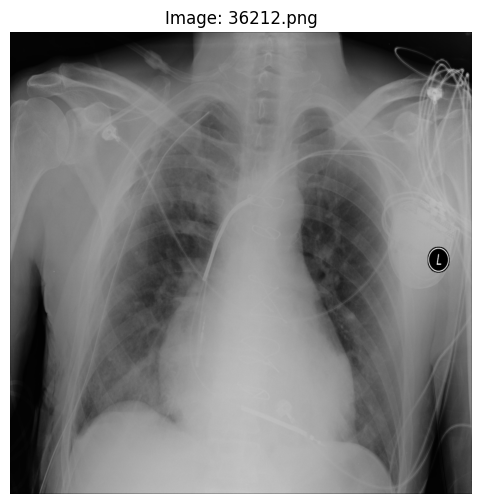

In [4]:
pipeline('/kaggle/input/chestx-det10/36212.png')

Label: lung cancer chest X-ray, Probability: 0.6591
Label: normal chest X-ray, Probability: 0.3032
Label: pneumonia chest X-ray, Probability: 0.0376
Label: pleural effusion chest X-ray, Probability: 0.0002


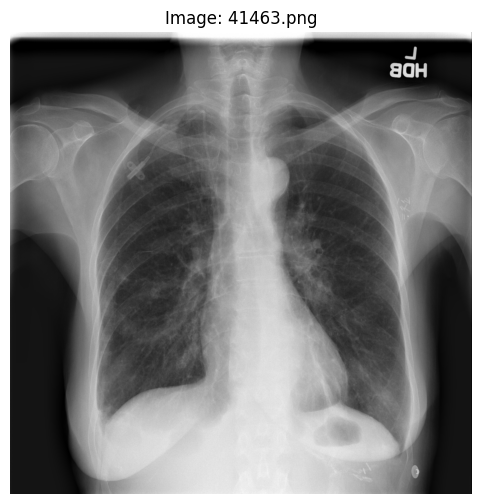

Label: lung cancer chest X-ray, Probability: 0.5141
Label: pneumonia chest X-ray, Probability: 0.4826
Label: pleural effusion chest X-ray, Probability: 0.0032
Label: normal chest X-ray, Probability: 0.0001


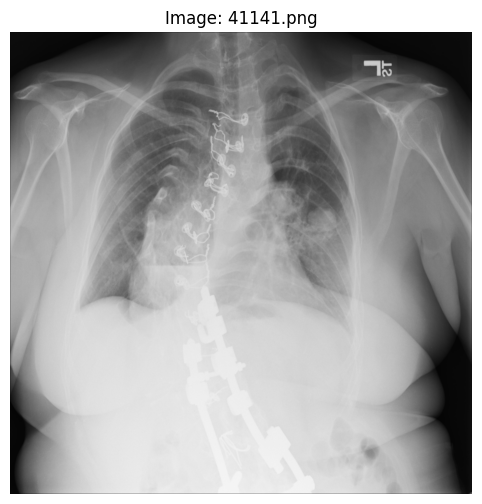

Label: pneumonia chest X-ray, Probability: 0.5078
Label: lung cancer chest X-ray, Probability: 0.4915
Label: normal chest X-ray, Probability: 0.0007
Label: pleural effusion chest X-ray, Probability: 0.0001


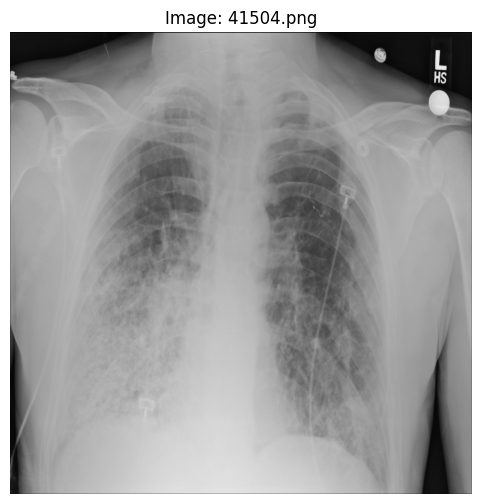

Label: lung cancer chest X-ray, Probability: 0.7865
Label: pneumonia chest X-ray, Probability: 0.1072
Label: normal chest X-ray, Probability: 0.0581
Label: pleural effusion chest X-ray, Probability: 0.0482


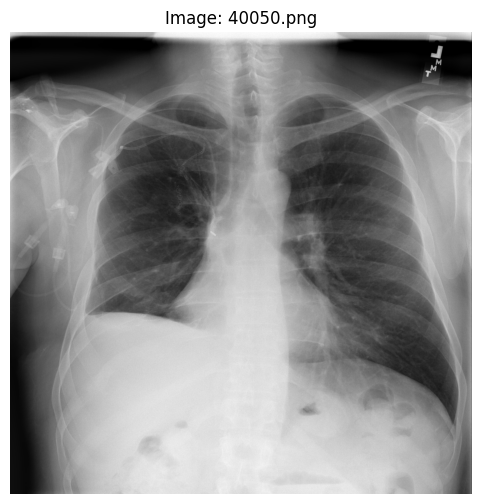

Label: normal chest X-ray, Probability: 0.6130
Label: lung cancer chest X-ray, Probability: 0.3774
Label: pneumonia chest X-ray, Probability: 0.0086
Label: pleural effusion chest X-ray, Probability: 0.0010


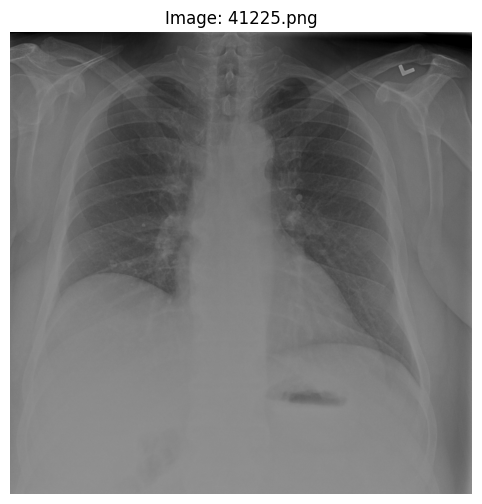

Label: lung cancer chest X-ray, Probability: 0.5055
Label: pleural effusion chest X-ray, Probability: 0.3343
Label: pneumonia chest X-ray, Probability: 0.1597
Label: normal chest X-ray, Probability: 0.0005


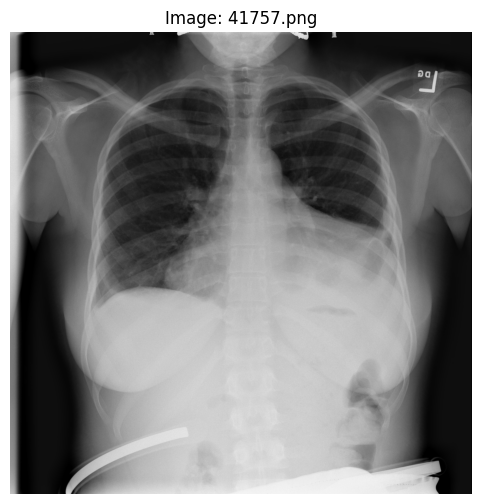

Label: pneumonia chest X-ray, Probability: 0.6874
Label: lung cancer chest X-ray, Probability: 0.1938
Label: normal chest X-ray, Probability: 0.1133
Label: pleural effusion chest X-ray, Probability: 0.0054


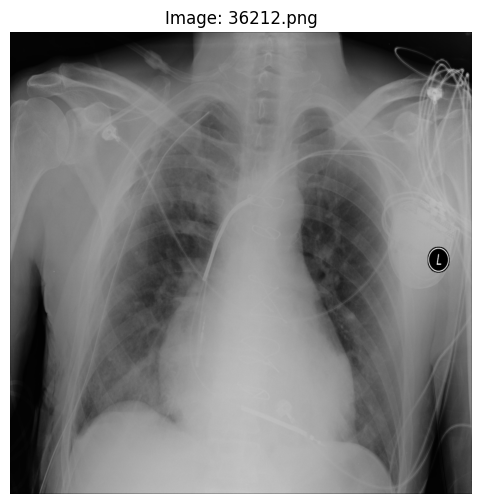

Label: lung cancer chest X-ray, Probability: 0.4954
Label: normal chest X-ray, Probability: 0.3666
Label: pneumonia chest X-ray, Probability: 0.0896
Label: pleural effusion chest X-ray, Probability: 0.0484


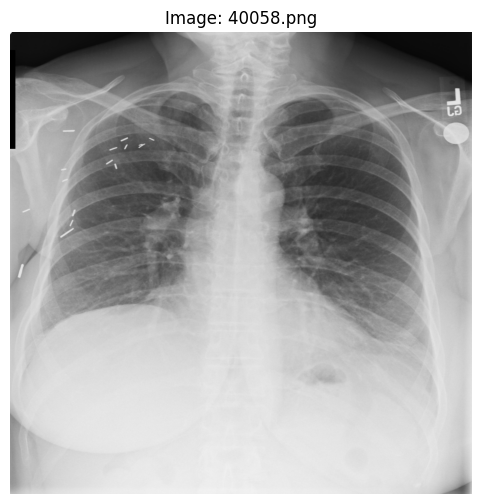

Label: normal chest X-ray, Probability: 0.6052
Label: lung cancer chest X-ray, Probability: 0.3908
Label: pneumonia chest X-ray, Probability: 0.0040
Label: pleural effusion chest X-ray, Probability: 0.0000


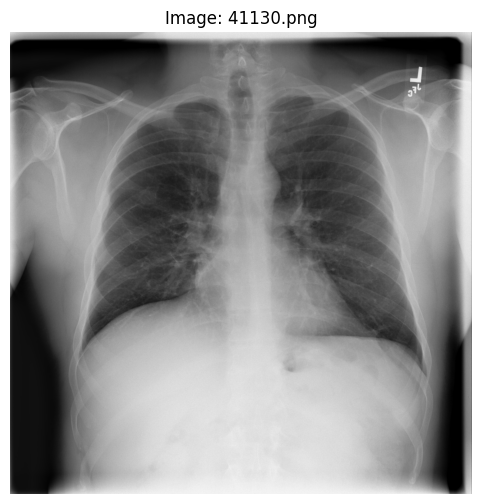

In [5]:
import os 
from PIL import Image
k = 10 
image_files = os.listdir('/kaggle/input/chestx-det10')
image_dir = '/kaggle/input/chestx-det10'

for image_file in image_files:
    k = k-1
    if k==0 :
        break
    image_path = os.path.join(image_dir, image_file)
    pipeline(image_path)

In [19]:
!pip install timm

In [20]:
!pip install transformers timm torchvision

Label: pneumonia chest X-ray, Probability: 0.6874
Label: lung cancer chest X-ray, Probability: 0.1938
Label: normal chest X-ray, Probability: 0.1133
Label: pleural effusion chest X-ray, Probability: 0.0054


/tmp/ipykernel_31/1343277615.py:89: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


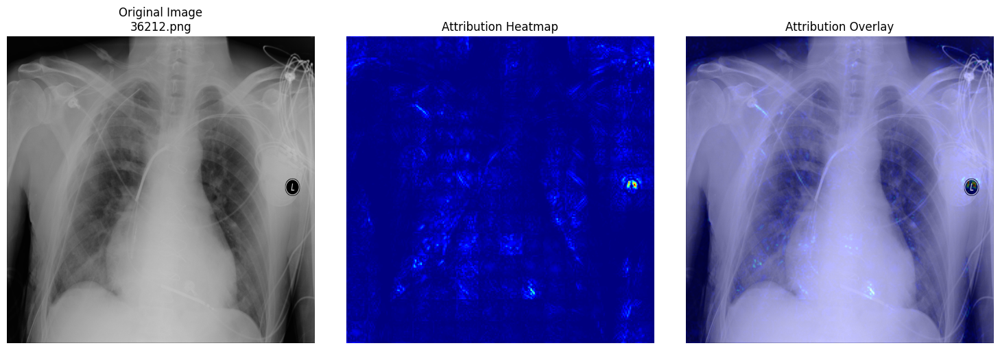

{'image': '36212.png',
 'classification': {'pneumonia chest X-ray': 0.6874460577964783,
  'lung cancer chest X-ray': 0.19378697872161865,
  'normal chest X-ray': 0.11333674937486649,
  'pleural effusion chest X-ray': 0.005430190358310938}}

In [39]:
import os
os.system("pip install open_clip_torch==2.23.0")

import torch
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from open_clip import create_model_from_pretrained, get_tokenizer
import logging

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Check GPU availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
logger.info(f"Using device: {device}")

# Load BiomedCLIP model and tokenizer
try:
    model, preprocess = create_model_from_pretrained(
        'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
    )
    tokenizer = get_tokenizer(
        'hf-hub:microsoft/BiomedCLIP-PubMedBERT_256-vit_base_patch16_224'
    )
    model.to(device)
    model.eval()
    logger.info("Model and tokenizer loaded successfully")
except Exception as e:
    logger.error(f"Error loading model: {e}")
    raise

# Integrated Gradients implementation
def integrated_gradients(image_tensor, model, text_features, logit_scale, class_idx, baseline=None, steps=50):
    """
    Compute Integrated Gradients for the input image and specified class.
    """
    # Create baseline (black image) if not provided
    if baseline is None:
        baseline = torch.zeros_like(image_tensor)
    
    # Ensure image requires gradients
    image_tensor = image_tensor.clone().detach().requires_grad_(True)
    
    # Initialize attributions
    attributions = torch.zeros_like(image_tensor)
    
    # Interpolate between baseline and input
    for alpha in np.linspace(0, 1, steps):
        interpolated = baseline + alpha * (image_tensor - baseline)
        interpolated = interpolated.clone().detach().requires_grad_(True)
        interpolated.retain_grad()  # Ensure gradients are retained for non-leaf tensor
        
        # Forward pass
        image_features, _, _ = model(interpolated, None)
        logits = logit_scale * (image_features @ text_features.t())
        
        # Compute gradients
        model.zero_grad()
        logits[0, class_idx].backward()
        grads = interpolated.grad.clone().detach()
        
        # Accumulate gradients
        attributions += grads / steps
    
    # Compute attributions as (input - baseline) * integrated gradients
    attributions = (image_tensor - baseline) * attributions
    
    # Convert to grayscale attribution map
    attributions = attributions.abs().sum(dim=1, keepdim=True)  # Sum across channels
    attributions = attributions.squeeze(1).detach().cpu().numpy()  # [batch, height, width]
    
    # Normalize
    attributions = (attributions - attributions.min()) / (attributions.max() - attributions.min() + 1e-10)
    
    return attributions[0]  # [height, width]

def save_and_display_attributions(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load original image
    img = Image.open(img_path).convert('RGB')
    img_array = np.array(img)

    # Rescale heatmap to 0-255
    heatmap = np.uint8(255 * heatmap)

    # Apply jet colormap
    jet = cm.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Resize heatmap to image size
    jet_heatmap = np.array(Image.fromarray(np.uint8(jet_heatmap * 255)).resize((img_array.shape[1], img_array.shape[0])))

    # Superimpose heatmap on original image
    superimposed_img = jet_heatmap * alpha + img_array
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)

    # Save superimposed image
    Image.fromarray(superimposed_img).save(cam_path)

    # Display results
    plt.figure(figsize=(15, 5))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title(f"Original Image\n{os.path.basename(img_path)}")
    plt.axis('off')

    # Heatmap
    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title("Attribution Heatmap")
    plt.axis('off')

    # Overlay
    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title("Attribution Overlay")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

def pipeline(image_path):
    # Define multiple text findings for similarity
    text_findings_list = [
        "Findings: Normal lung fields, no evidence of pneumonia.",
        "Findings: Pneumonia detected in the lower lobes.",
        "Findings: Pleural effusion observed.",
        "Findings: Suspected lung cancer."
    ]

    # Privacy: Anonymize text
    anonymized_texts = [
        text.replace("PatientName", "Patient001")
            .replace("2023-01-01", "")
            .replace("Boston Hospital", "")
        for text in text_findings_list
    ]
    logger.info("Text data anonymized to remove PII and sensitive metadata")

    # Define labels for zero-shot classification
    labels = [
        'normal chest X-ray',
        'pneumonia chest X-ray',
        'pleural effusion chest X-ray',
        'lung cancer chest X-ray'
    ]
    template = 'this is a photo of '

    # Process image
    try:
        if not os.path.exists(image_path):
            raise FileNotFoundError(f"Image not found at {image_path}")
        image = Image.open(image_path).convert('RGB')
        image_tensor = preprocess(image).unsqueeze(0).to(device)
        logger.info(f"Image {os.path.basename(image_path)} processed successfully")
    except Exception as e:
        logger.error(f"Error processing image {image_path}: {e}")
        raise

    # Process text for classification
    try:
        texts = tokenizer([template + label for label in labels], context_length=256).to(device)
        logger.info("Text labels tokenized for classification")
    except Exception as e:
        logger.error(f"Error tokenizing classification texts: {e}")
        raise

    # Zero-shot classification
    classification_result = {}
    try:
        with torch.no_grad():
            image_features, text_features, logit_scale = model(image_tensor, texts)
            logits = (logit_scale * image_features @ text_features.t()).softmax(dim=-1)
            logits = logits.cpu().numpy()
            sorted_indices = torch.argsort(torch.tensor(logits), dim=-1, descending=True).cpu().numpy()
        logger.info(f"Classification completed for {os.path.basename(image_path)}")
        for i, idx in enumerate(sorted_indices[0]):
            print(f"Label: {labels[idx]}, Probability: {logits[0][idx]:.4f}")
            classification_result[labels[idx]] = float(logits[0][idx])
    except Exception as e:
        logger.error(f"Error during classification for {image_path}: {e}")
        raise

    # Integrated Gradients for explainability
    try:
        top_class_idx = sorted_indices[0][0]
        logger.info(f"Generating Integrated Gradients for top class: {labels[top_class_idx]}")

        # Generate attribution heatmap
        heatmap = integrated_gradients(image_tensor, model, text_features, logit_scale, top_class_idx)

        # Display attributions
        save_and_display_attributions(image_path, heatmap, cam_path="cam.jpg", alpha=0.4)

    except Exception as e:
        logger.error(f"Error generating Integrated Gradients: {e}")
        raise

    # Process text for similarity
    try:
        text_tensors = tokenizer(anonymized_texts, context_length=256).to(device)
        logger.info("Text findings tokenized for similarity")
    except Exception as e:
        logger.error(f"Error tokenizing similarity texts: {e}")
        raise

    # Return results
    return {
        'image': os.path.basename(image_path),
        'classification': classification_result,
    }

# Example usage
pipeline('/kaggle/input/chestx-det10/36212.png')

Label: normal chest X-ray, Probability: 0.4981
Label: lung cancer chest X-ray, Probability: 0.4797
Label: pneumonia chest X-ray, Probability: 0.0222
Label: pleural effusion chest X-ray, Probability: 0.0000


/tmp/ipykernel_31/1343277615.py:89: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


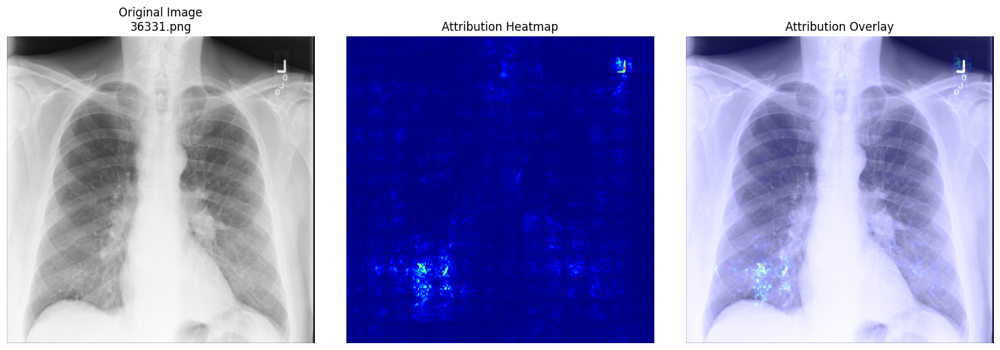

{'image': '36331.png',
 'classification': {'normal chest X-ray': 0.4980732798576355,
  'lung cancer chest X-ray': 0.4796689450740814,
  'pneumonia chest X-ray': 0.022239629179239273,
  'pleural effusion chest X-ray': 1.8187574823969044e-05}}

In [41]:
pipeline('/kaggle/input/chestx-det10/36331.png')

Label: lung cancer chest X-ray, Probability: 0.6596
Label: normal chest X-ray, Probability: 0.3009
Label: pneumonia chest X-ray, Probability: 0.0390
Label: pleural effusion chest X-ray, Probability: 0.0004


/tmp/ipykernel_31/1343277615.py:89: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


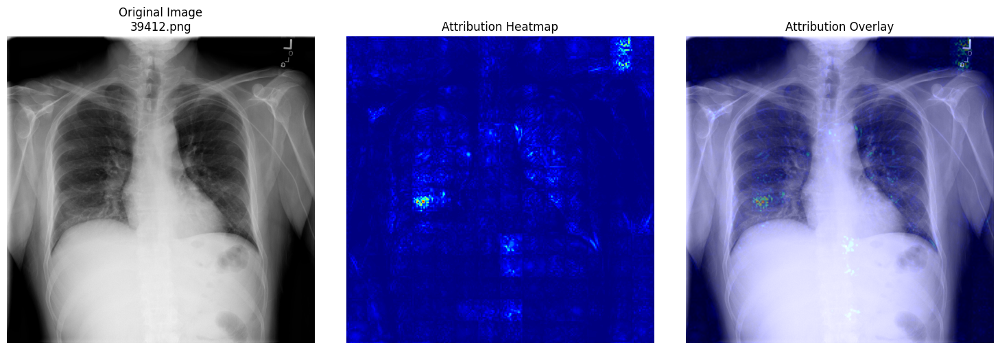

{'image': '39412.png',
 'classification': {'lung cancer chest X-ray': 0.6596280932426453,
  'normal chest X-ray': 0.30090847611427307,
  'pneumonia chest X-ray': 0.03903352469205856,
  'pleural effusion chest X-ray': 0.00042990760994143784}}

In [42]:
pipeline('/kaggle/input/chestx-det10/39412.png')

Label: lung cancer chest X-ray, Probability: 0.6591
Label: normal chest X-ray, Probability: 0.3032
Label: pneumonia chest X-ray, Probability: 0.0376
Label: pleural effusion chest X-ray, Probability: 0.0002


/tmp/ipykernel_31/1343277615.py:89: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


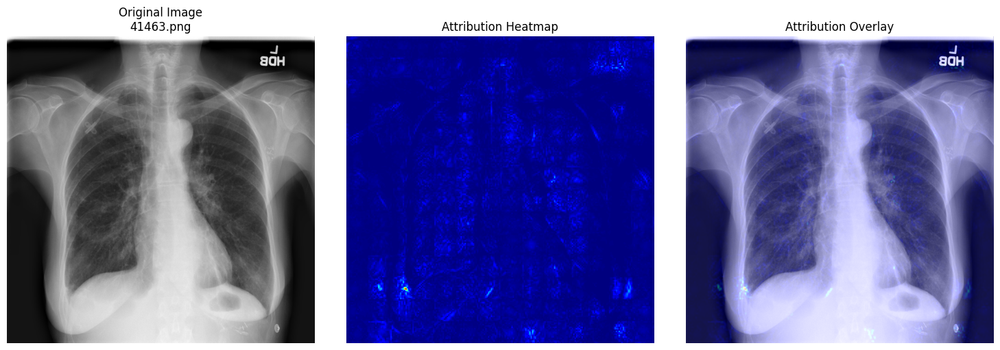

Label: lung cancer chest X-ray, Probability: 0.5141
Label: pneumonia chest X-ray, Probability: 0.4826
Label: pleural effusion chest X-ray, Probability: 0.0032
Label: normal chest X-ray, Probability: 0.0001


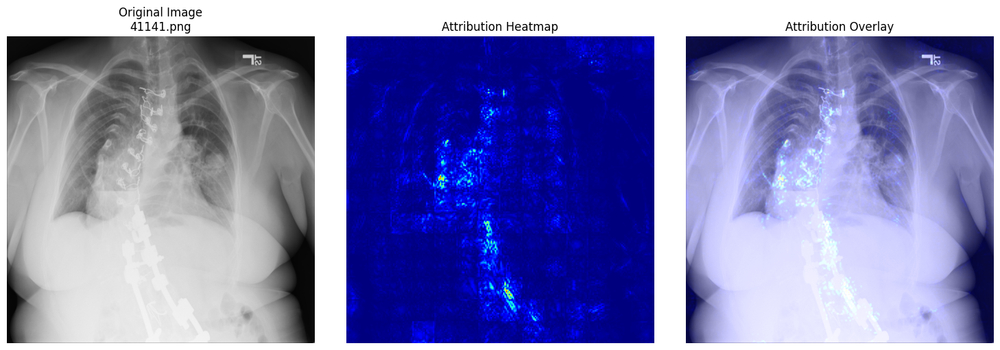

Label: pneumonia chest X-ray, Probability: 0.5078
Label: lung cancer chest X-ray, Probability: 0.4915
Label: normal chest X-ray, Probability: 0.0007
Label: pleural effusion chest X-ray, Probability: 0.0001


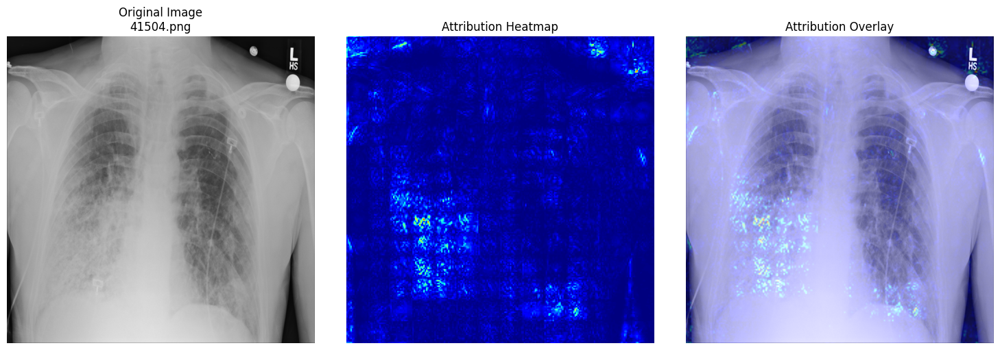

Label: lung cancer chest X-ray, Probability: 0.7865
Label: pneumonia chest X-ray, Probability: 0.1072
Label: normal chest X-ray, Probability: 0.0581
Label: pleural effusion chest X-ray, Probability: 0.0482


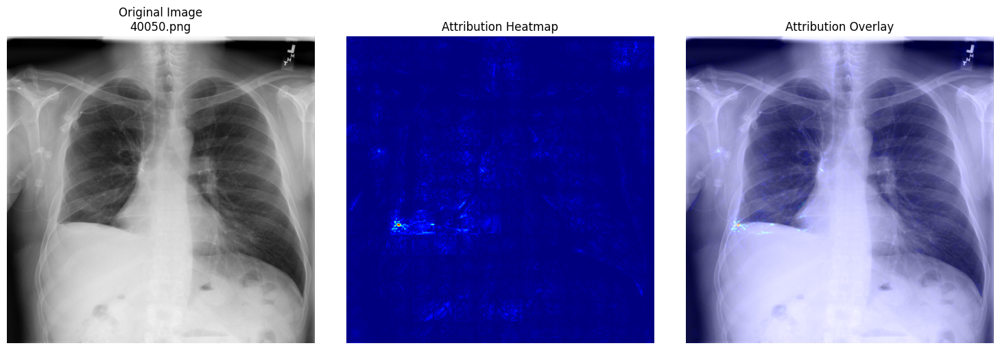

Label: normal chest X-ray, Probability: 0.6130
Label: lung cancer chest X-ray, Probability: 0.3774
Label: pneumonia chest X-ray, Probability: 0.0086
Label: pleural effusion chest X-ray, Probability: 0.0010


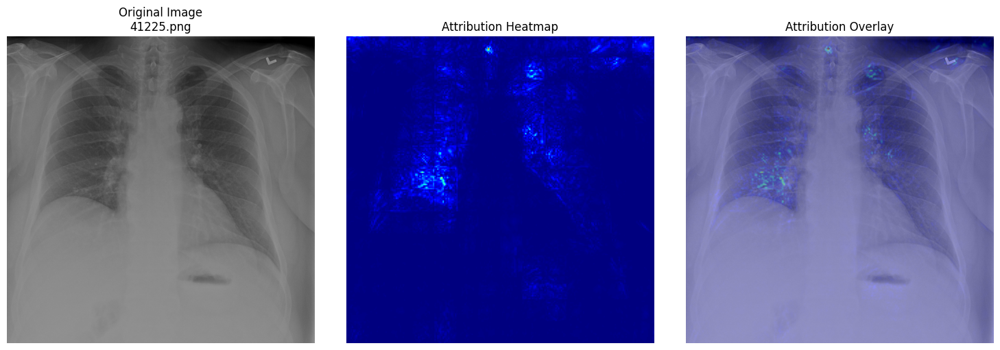

Label: lung cancer chest X-ray, Probability: 0.5055
Label: pleural effusion chest X-ray, Probability: 0.3343
Label: pneumonia chest X-ray, Probability: 0.1597
Label: normal chest X-ray, Probability: 0.0005


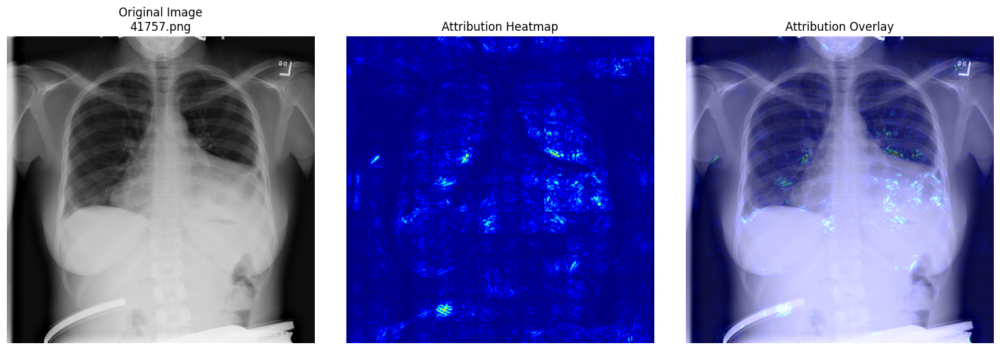

Label: pneumonia chest X-ray, Probability: 0.6874
Label: lung cancer chest X-ray, Probability: 0.1938
Label: normal chest X-ray, Probability: 0.1133
Label: pleural effusion chest X-ray, Probability: 0.0054


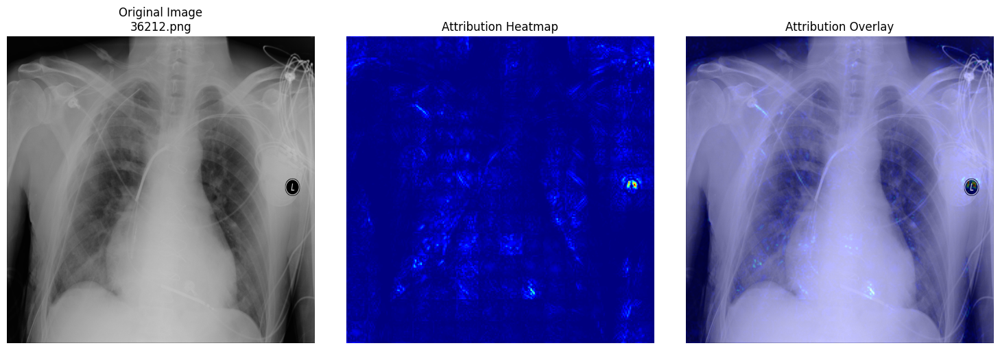

Label: lung cancer chest X-ray, Probability: 0.4954
Label: normal chest X-ray, Probability: 0.3666
Label: pneumonia chest X-ray, Probability: 0.0896
Label: pleural effusion chest X-ray, Probability: 0.0484


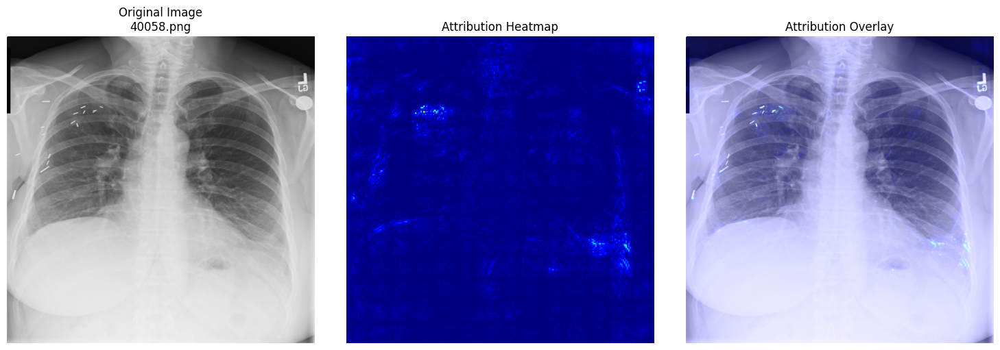

Label: normal chest X-ray, Probability: 0.6052
Label: lung cancer chest X-ray, Probability: 0.3908
Label: pneumonia chest X-ray, Probability: 0.0040
Label: pleural effusion chest X-ray, Probability: 0.0000


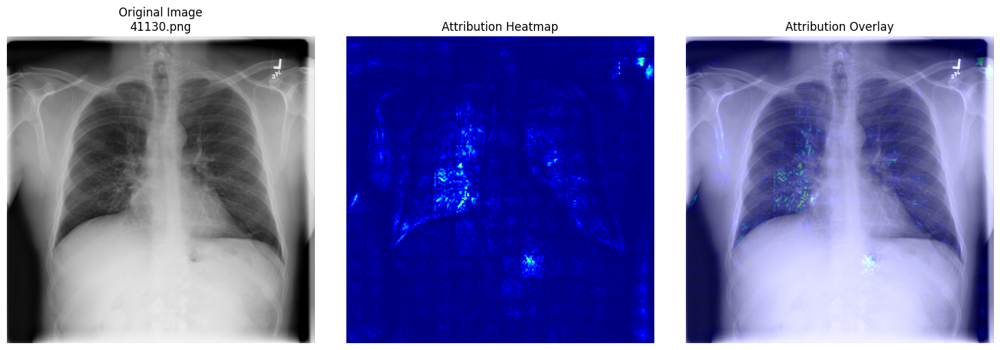

Label: pneumonia chest X-ray, Probability: 0.5768
Label: lung cancer chest X-ray, Probability: 0.2759
Label: normal chest X-ray, Probability: 0.1401
Label: pleural effusion chest X-ray, Probability: 0.0072


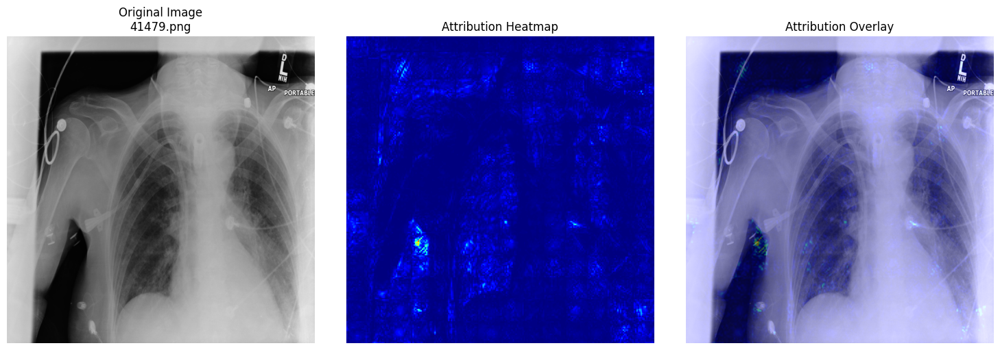

Label: normal chest X-ray, Probability: 0.7142
Label: lung cancer chest X-ray, Probability: 0.2674
Label: pneumonia chest X-ray, Probability: 0.0184
Label: pleural effusion chest X-ray, Probability: 0.0000


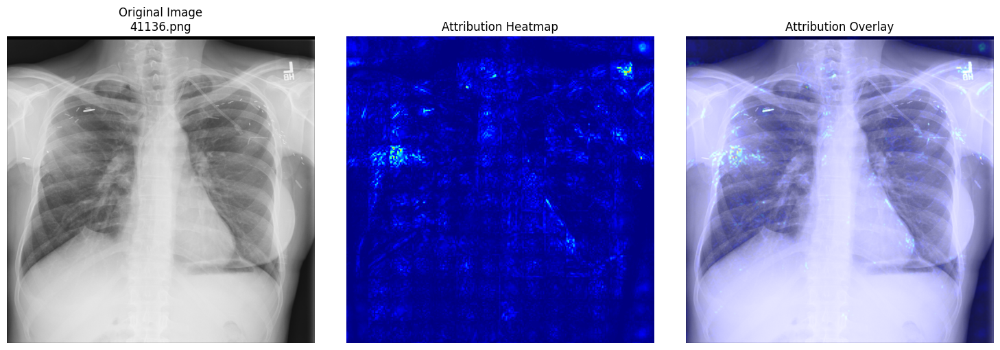

Label: lung cancer chest X-ray, Probability: 0.6472
Label: pleural effusion chest X-ray, Probability: 0.2386
Label: pneumonia chest X-ray, Probability: 0.1076
Label: normal chest X-ray, Probability: 0.0066


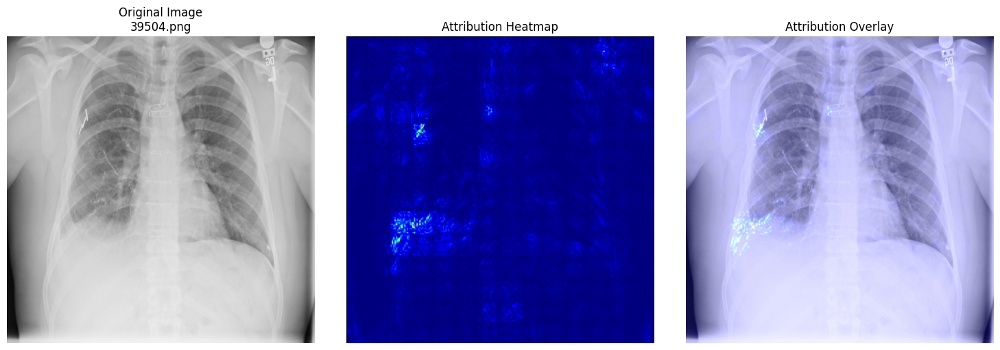

Label: normal chest X-ray, Probability: 0.6819
Label: lung cancer chest X-ray, Probability: 0.2739
Label: pneumonia chest X-ray, Probability: 0.0295
Label: pleural effusion chest X-ray, Probability: 0.0146


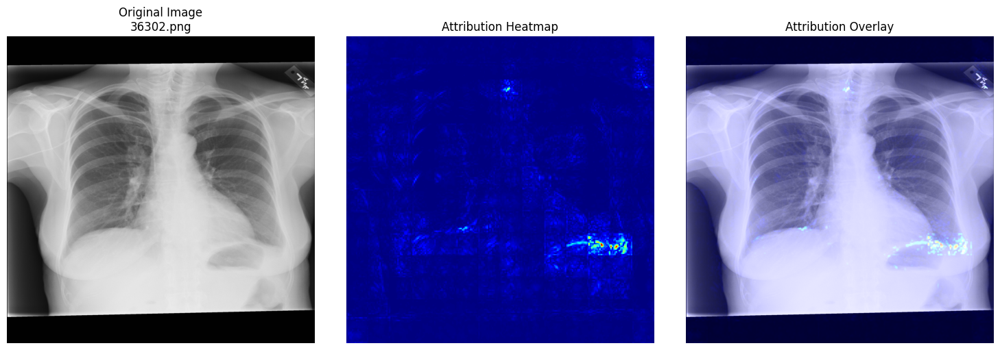

Label: normal chest X-ray, Probability: 0.6045
Label: lung cancer chest X-ray, Probability: 0.3827
Label: pneumonia chest X-ray, Probability: 0.0122
Label: pleural effusion chest X-ray, Probability: 0.0006


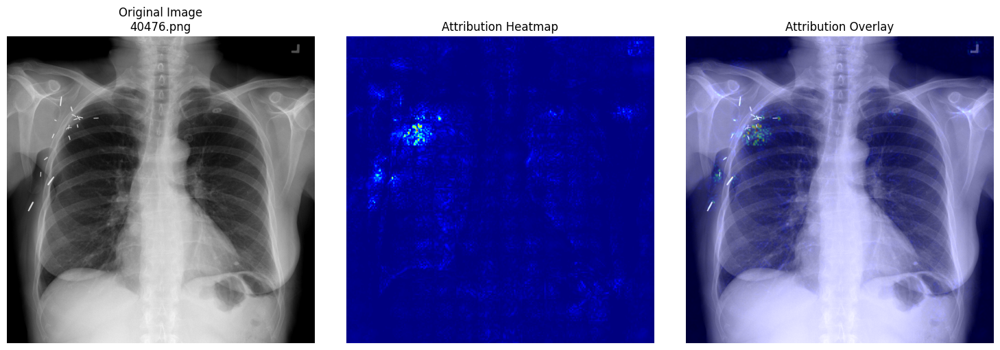

Label: lung cancer chest X-ray, Probability: 0.9525
Label: pneumonia chest X-ray, Probability: 0.0473
Label: pleural effusion chest X-ray, Probability: 0.0001
Label: normal chest X-ray, Probability: 0.0001


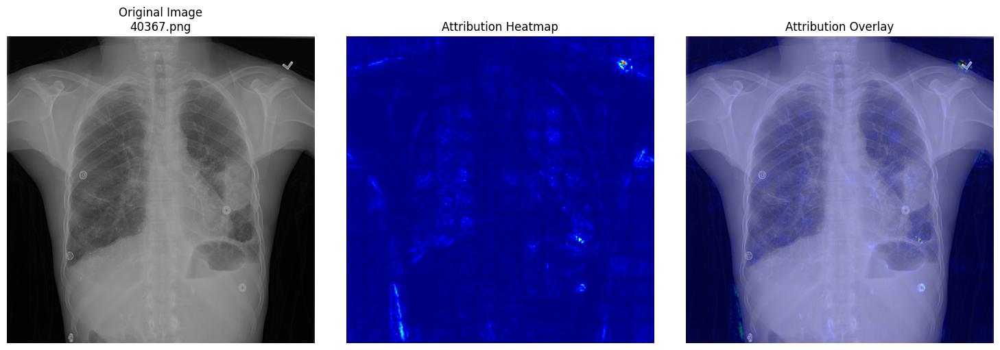

Label: lung cancer chest X-ray, Probability: 0.4789
Label: normal chest X-ray, Probability: 0.4416
Label: pneumonia chest X-ray, Probability: 0.0795
Label: pleural effusion chest X-ray, Probability: 0.0000


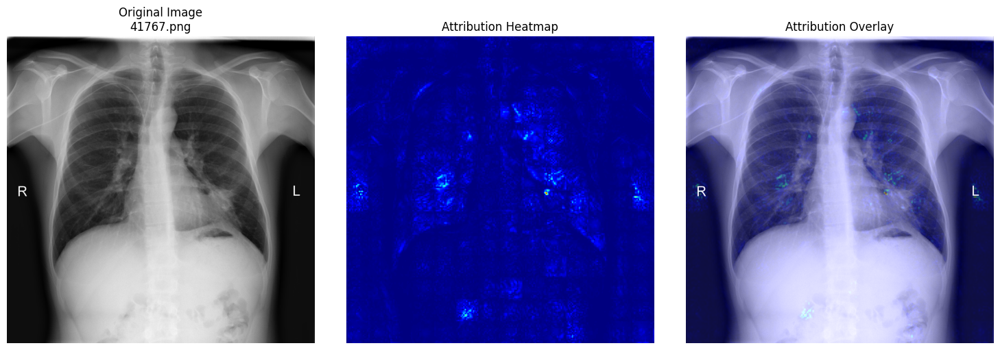

Label: pleural effusion chest X-ray, Probability: 0.8280
Label: lung cancer chest X-ray, Probability: 0.1480
Label: pneumonia chest X-ray, Probability: 0.0231
Label: normal chest X-ray, Probability: 0.0008


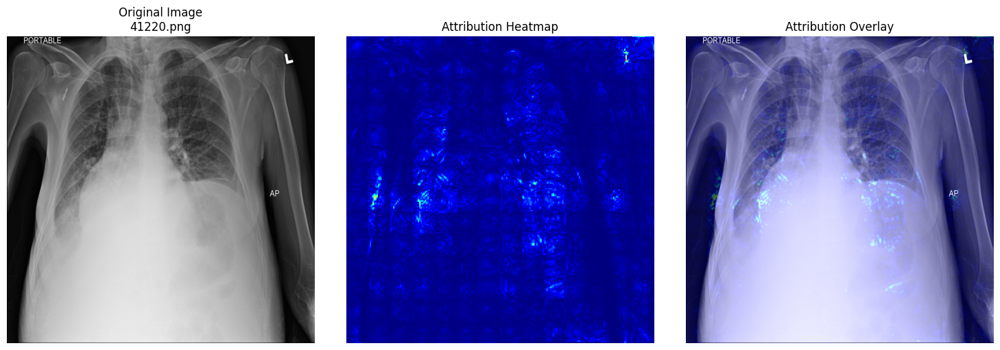

Label: lung cancer chest X-ray, Probability: 0.5655
Label: normal chest X-ray, Probability: 0.3319
Label: pneumonia chest X-ray, Probability: 0.0991
Label: pleural effusion chest X-ray, Probability: 0.0035


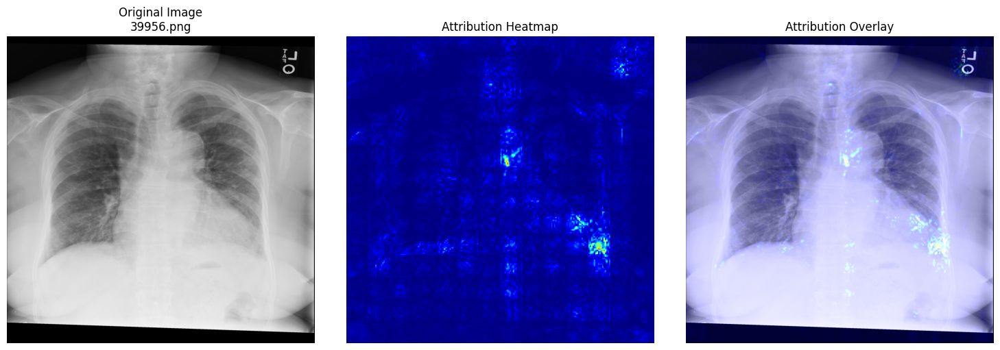

Label: lung cancer chest X-ray, Probability: 0.6215
Label: pneumonia chest X-ray, Probability: 0.3693
Label: pleural effusion chest X-ray, Probability: 0.0079
Label: normal chest X-ray, Probability: 0.0013


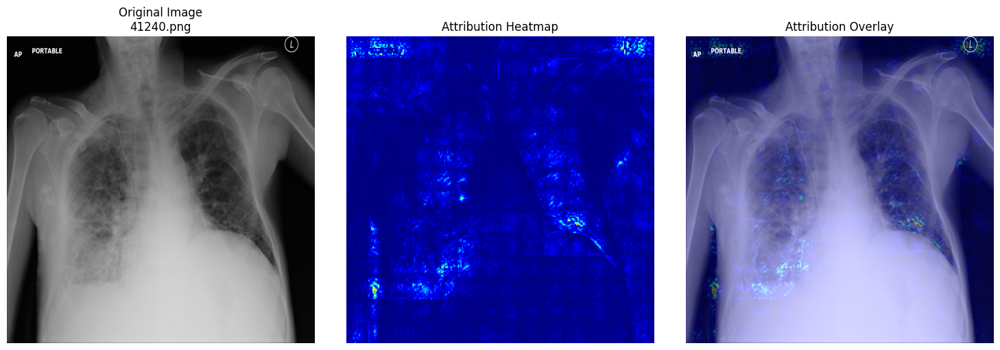

In [44]:
import os 
from PIL import Image
k = 20 
image_files = os.listdir('/kaggle/input/chestx-det10')
image_dir = '/kaggle/input/chestx-det10'

for image_file in image_files:
    k = k-1
    if k==0 :
        break
    image_path = os.path.join(image_dir, image_file)
    pipeline(image_path)